### Install dependencies

In [2]:
!pip install boto3 sagemaker

Defaulting to user installation because normal site-packages is not writeable


### Setup

1. Create a new endpoint at https://us-east-2.console.aws.amazon.com/sagemaker/home?region=us-east-2#/endpoints then set `ENDPOINT` to it's name.
2. You can do inference in a single file or in a entire folder, set the path to it using `INPUT_PATH`

In [3]:
ENDPOINT = "your_endpoint_name"

# local file or folder
INPUT_PATH = "./input/notus/"
# INPUT_PATH = "./drones.jpg"

### Run inference

Now that we have set the paths, we will run the images thuru amazon sagemaker's endpoint.

Note: This assumes you have created the endpoint and a IAM access been configured.

In [2]:
import os
import glob
import json
import boto3
import sagemaker

ALLOWED_EXTENSIONS = set(['png', 'jpg', 'jpeg', 'gif', 'webp', 'bmp'])

def getFiles(base):
    if os.path.isfile(base):
        return [base]
    else:
        return glob.glob(os.path.join(base, '**'), recursive=True)
    
# initalize client
sagemaker = boto3.client(
    'runtime.sagemaker',
    region_name='us-east-2'
)

flist = getFiles(INPUT_PATH)
print("Processing: {} files...".format(len(flist)))

for fpath in flist:
    ext = fpath.split('.')[-1].lower() if '.' in fpath else None
    
    # skip unsupported / invalid file extensions
    if ext is None or ext not in ALLOWED_EXTENSIONS:
        continue
    
    # load input
    with open(fpath, 'rb') as fh:
        payload = fh.read()

    # invoke inference
    result = sagemaker.invoke_endpoint(
            EndpointName=ENDPOINT,
            ContentType='image/{}'.format(ext),
            Body=bytearray(payload))

    # sagemaker request raw response
    # print('sagemaker response:\n\n', result, '\n')

    # inference response
    print('file: {} inference response:\n{}\n'.format(
        fpath,
        json.dumps(json.loads(result['Body'].read().decode()), sort_keys=True, indent=4))
    )

Processing: 51 files...
file: ./examples/notus/018.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
                "classid": 7,
                "confidence": 0.9957981705665588,
                "det_bbox": [
                    0.12250715494155884,
                    0.5206485986709595,
                    0.3192828595638275,
                    0.6492767333984375
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9940416216850281,
                "det_bbox": [
                    0.4388357102870941,
                    0.34280693531036377,
                    0.631182074546814,
                    0.47206801176071167
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9931679368019104,
          

file: ./examples/notus/017.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
                "classid": 7,
                "confidence": 0.9962193369865417,
                "det_bbox": [
                    0.8750579357147217,
                    0.41789335012435913,
                    0.9574853777885437,
                    0.5921871066093445
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9954421520233154,
                "det_bbox": [
                    0.17846202850341797,
                    0.16233937442302704,
                    0.2460138201713562,
                    0.29614585638046265
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9938449859619141,
                "det_bbox": [
  

file: ./examples/notus/004.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
                "classid": 7,
                "confidence": 0.9953323006629944,
                "det_bbox": [
                    0.472583144903183,
                    0.10624559968709946,
                    0.5457137823104858,
                    0.23634028434753418
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9944315552711487,
                "det_bbox": [
                    0.06259773671627045,
                    0.5640760064125061,
                    0.20473699271678925,
                    0.7154945731163025
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9941381216049194,
                "det_bbox": [
   

file: ./examples/notus/047.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
                "classid": 7,
                "confidence": 0.9933398365974426,
                "det_bbox": [
                    0.7877666354179382,
                    0.4709407687187195,
                    0.8655959963798523,
                    0.5789037942886353
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9929314851760864,
                "det_bbox": [
                    0.012152783572673798,
                    0.6508760452270508,
                    0.08286102861166,
                    0.74693363904953
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9912404417991638,
                "det_bbox": [
        

file: ./examples/notus/031.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
                "classid": 7,
                "confidence": 0.9974738955497742,
                "det_bbox": [
                    0.18670928478240967,
                    0.11338771134614944,
                    0.26332685351371765,
                    0.24419540166854858
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9974637031555176,
                "det_bbox": [
                    0.2920418381690979,
                    0.13065209984779358,
                    0.37244322896003723,
                    0.266642689704895
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9971933960914612,
                "det_bbox": [
 

file: ./examples/notus/005.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
                "classid": 7,
                "confidence": 0.9983444213867188,
                "det_bbox": [
                    0.625453770160675,
                    0.1764698326587677,
                    0.6900495290756226,
                    0.26212078332901
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.996301531791687,
                "det_bbox": [
                    0.41795018315315247,
                    0.7936980724334717,
                    0.4628274142742157,
                    0.8421149849891663
                ],
                "label": "airplane",
                "scan": "global"
            }
        ]
    }
}

file: ./examples/notus/042.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
     

file: ./examples/notus/044.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
                "classid": 7,
                "confidence": 0.9897358417510986,
                "det_bbox": [
                    0.37469571828842163,
                    0.8087054491043091,
                    0.46720802783966064,
                    0.9815647006034851
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9740763306617737,
                "det_bbox": [
                    0.4467042088508606,
                    0.5614873170852661,
                    0.5356007814407349,
                    0.714097261428833
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9718539714813232,
                "det_bbox": [
     

file: ./examples/notus/001.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
                "classid": 7,
                "confidence": 0.996683657169342,
                "det_bbox": [
                    0.588249921798706,
                    0.5963479280471802,
                    0.6564049124717712,
                    0.7007471919059753
                ],
                "label": "airplane",
                "scan": "global"
            }
        ]
    }
}

file: ./examples/notus/020.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
                "classid": 7,
                "confidence": 0.9953558444976807,
                "det_bbox": [
                    0.041866179555654526,
                    0.4232567548751831,
                    0.09197485446929932,
                    0.5799635648727417
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
 

file: ./examples/notus/040.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
                "classid": 7,
                "confidence": 0.9980706572532654,
                "det_bbox": [
                    0.6415401697158813,
                    0.052672579884529114,
                    0.7018431425094604,
                    0.21590189635753632
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.997057318687439,
                "det_bbox": [
                    0.4361588656902313,
                    0.15428322553634644,
                    0.49719321727752686,
                    0.3060075044631958
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9966643452644348,
                "det_bbox": [
  

file: ./examples/notus/041.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
                "classid": 7,
                "confidence": 0.9958611130714417,
                "det_bbox": [
                    0.03335627168416977,
                    0.43833041191101074,
                    0.11773545295000076,
                    0.5999757051467896
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9950777292251587,
                "det_bbox": [
                    0.44412124156951904,
                    0.3853047788143158,
                    0.5250529050827026,
                    0.5465609431266785
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.993643045425415,
                "det_bbox": [
   

file: ./examples/notus/029.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
                "classid": 7,
                "confidence": 0.9958943128585815,
                "det_bbox": [
                    0.18854357302188873,
                    0.651018500328064,
                    0.3273431062698364,
                    0.8010911345481873
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9943601489067078,
                "det_bbox": [
                    0.2754232585430145,
                    0.29029181599617004,
                    0.3658379912376404,
                    0.3969728648662567
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9933149218559265,
                "det_bbox": [
     

file: ./examples/notus/037.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
                "classid": 7,
                "confidence": 0.9963685274124146,
                "det_bbox": [
                    0.6479450464248657,
                    0.3364242911338806,
                    0.7448347210884094,
                    0.5070165395736694
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9933924078941345,
                "det_bbox": [
                    0.5341325402259827,
                    0.3564528524875641,
                    0.6285613775253296,
                    0.5212647318840027
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9933614730834961,
                "det_bbox": [
      

file: ./examples/notus/021.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
                "classid": 7,
                "confidence": 0.9939769506454468,
                "det_bbox": [
                    0.08365237712860107,
                    0.7797796726226807,
                    0.1504727602005005,
                    0.8686380386352539
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9607540965080261,
                "det_bbox": [
                    0.07867693156003952,
                    0.6464257836341858,
                    0.16398966312408447,
                    0.7468359470367432
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.930748462677002,
                "det_bbox": [
    

file: ./examples/notus/012.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
                "classid": 7,
                "confidence": 0.9975758194923401,
                "det_bbox": [
                    0.3532966077327728,
                    0.8465291261672974,
                    0.40429481863975525,
                    0.9073340892791748
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.986445963382721,
                "det_bbox": [
                    0.5705581903457642,
                    0.2025623768568039,
                    0.6242451667785645,
                    0.2606126070022583
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.3249499499797821,
                "det_bbox": [
      

file: ./examples/notus/006.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
                "classid": 7,
                "confidence": 0.9932791590690613,
                "det_bbox": [
                    0.6682128310203552,
                    0.07879014313220978,
                    0.7746626734733582,
                    0.1965523064136505
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.992499053478241,
                "det_bbox": [
                    0.45700424909591675,
                    0.39722198247909546,
                    0.5460299849510193,
                    0.5457806587219238
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9912943243980408,
                "det_bbox": [
    

file: ./examples/notus/027.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
                "classid": 7,
                "confidence": 0.9962132573127747,
                "det_bbox": [
                    0.07332050800323486,
                    0.7987306714057922,
                    0.13961118459701538,
                    0.9310179352760315
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.995941698551178,
                "det_bbox": [
                    0.3489551544189453,
                    0.1930324137210846,
                    0.4143064618110657,
                    0.32846254110336304
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.994686484336853,
                "det_bbox": [
     

file: ./examples/notus/035.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
                "classid": 7,
                "confidence": 0.9963311553001404,
                "det_bbox": [
                    0.8711588978767395,
                    0.7958683371543884,
                    0.9412125945091248,
                    0.908673882484436
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.996231734752655,
                "det_bbox": [
                    0.22981524467468262,
                    0.19858816266059875,
                    0.30076688528060913,
                    0.31144189834594727
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9961262345314026,
                "det_bbox": [
    

file: ./examples/notus/007.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
                "classid": 7,
                "confidence": 0.9984055161476135,
                "det_bbox": [
                    0.5764387249946594,
                    0.2582041919231415,
                    0.6823102831840515,
                    0.36939358711242676
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9982947707176208,
                "det_bbox": [
                    0.28336015343666077,
                    0.7027920484542847,
                    0.37356191873550415,
                    0.8196080327033997
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9970766305923462,
                "det_bbox": [
   

file: ./examples/notus/028.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
                "classid": 7,
                "confidence": 0.9990830421447754,
                "det_bbox": [
                    0.3769792318344116,
                    0.7685747146606445,
                    0.45986250042915344,
                    0.8863504528999329
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9966519474983215,
                "det_bbox": [
                    0.5391307473182678,
                    0.7905911207199097,
                    0.6598894000053406,
                    0.96299809217453
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9962968230247498,
                "det_bbox": [
       

file: ./examples/notus/003.jpg inference response:
{
    "input.jpg": {
        "detections": [
            {
                "classid": 7,
                "confidence": 0.9966159462928772,
                "det_bbox": [
                    0.35699188709259033,
                    0.7996062636375427,
                    0.47568586468696594,
                    0.9565314054489136
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9964767098426819,
                "det_bbox": [
                    0.4870254695415497,
                    0.8325136303901672,
                    0.596636176109314,
                    0.9753297567367554
                ],
                "label": "airplane",
                "scan": "global"
            },
            {
                "classid": 7,
                "confidence": 0.9962517619132996,
                "det_bbox": [
     

## Run inference and draw

In this example we will draw the bounding boxes into the images

This requires OpenCV2 and matplotlib

In [4]:
%matplotlib inline

Processing: 51 files...


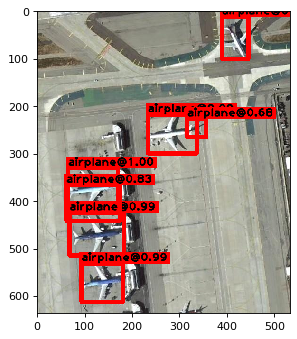

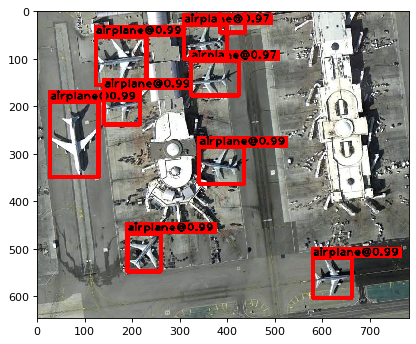

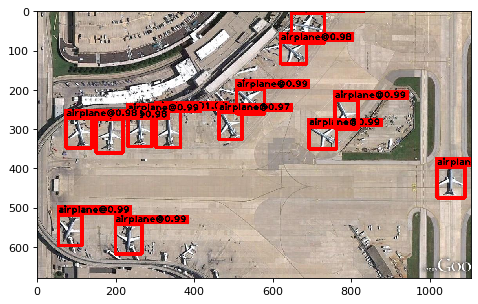

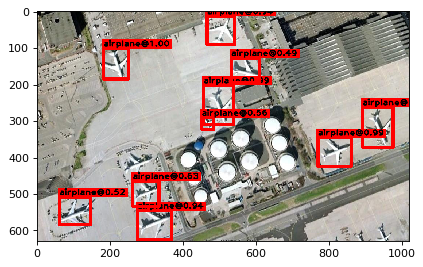

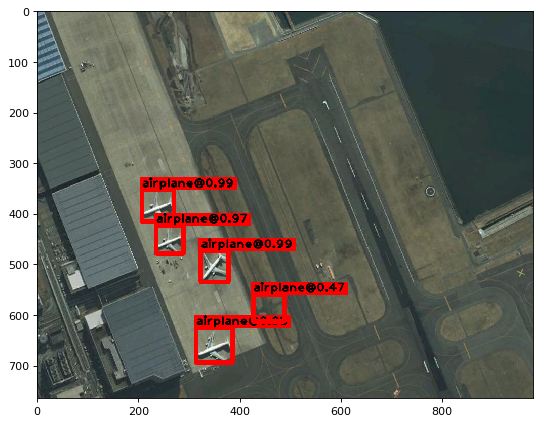

...

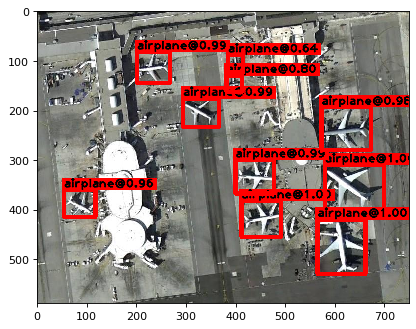

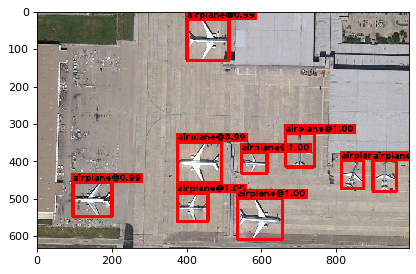

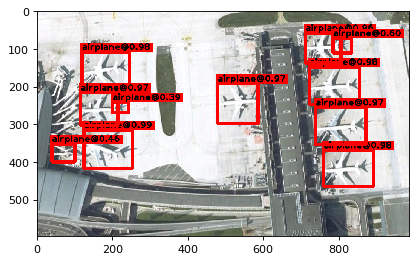

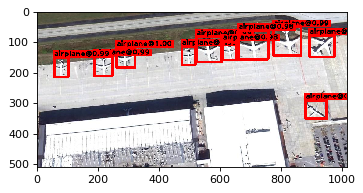

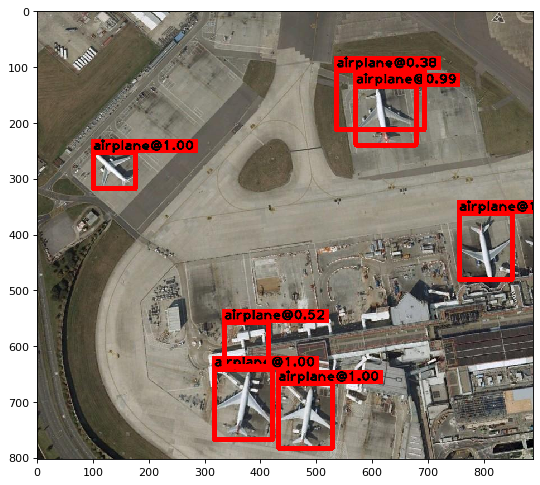

In [5]:
import os
import glob
import json
import boto3
import sagemaker
import cv2

# for displaying images at jupyter notebooks
from matplotlib import pyplot as plt

ALLOWED_EXTENSIONS = set(['png', 'jpg', 'jpeg', 'gif', 'webp', 'bmp'])

def getFiles(base):
    if os.path.isfile(base):
        return [base]
    else:
        return glob.glob(os.path.join(base, '**'), recursive=True)

def drawBB(
    image, header, x, y, xmax, ymax, color=(255, 0, 0), thickness=4*2, text_thickness=1*2,
    text_size=0.8*2, font=cv2.FONT_HERSHEY_PLAIN, footer=""
):
    # bounding box
    cv2.rectangle(image, (x, y), (xmax, ymax), color, thickness)
    
    # header text
    if header != '':
        (text_width, text_height) = cv2.getTextSize(header, font, fontScale=text_size, thickness=text_thickness)[0]
        
        cv2.rectangle(
            image,
            (max(0, int(x-(thickness/2))), max(0, int(y-5-text_height-(thickness/2)))),
            (int(x+text_width+(thickness/2)), int(y)),
            color,
            cv2.FILLED
        )
        
        cv2.putText(image, header, (max(0, x), max(0, y-5)), font, text_size, (0,0,0), text_thickness, cv2.LINE_AA)
        
    if footer != "":
        (footer_width, footer_height) = cv2.getTextSize(footer, font, fontScale=text_size, thickness=text_thickness)[0]
        
        cv2.rectangle(
            image,
            ( int(x-(thickness/2)), int(ymax+(thickness/2)) ),
            ( int(x+footer_width+(thickness/2)), int(ymax+footer_height+(thickness/2)) ),
            color,
            cv2.FILLED
        )
        
        cv2.putText(image, footer, ( x, int(ymax+12+(thickness/2)) ), font, text_size, (0,0,0), text_thickness, cv2.LINE_AA)

# initalize client
sagemaker = boto3.client(
    'runtime.sagemaker',
    region_name='us-east-2'
)

flist = getFiles(INPUT_PATH)
print("Processing: {} files...".format(len(flist)))

for fpath in flist:
    ext = fpath.split('.')[-1].lower() if '.' in fpath else None
    
    # skip unsupported / invalid file extensions
    if ext is None or ext not in ALLOWED_EXTENSIONS:
        continue
    
    # load input
    with open(fpath, 'rb') as fh:
        payload = fh.read()

    # invoke inference
    result = sagemaker.invoke_endpoint(
            EndpointName=ENDPOINT,
            ContentType='image/{}'.format(ext),
            Body=bytearray(payload))
    
    # parse response to json
    response = json.loads(result['Body'].read().decode())
    img = cv2.imread(fpath, 1)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    (height, width, channels) = img.shape
    
    try:
        for det in response['input.jpg']['detections']:
            xmin = det['det_bbox'][0] * width
            ymin = det['det_bbox'][1] * height
            xmax = det['det_bbox'][2] * width
            ymax = det['det_bbox'][3] * height
            
            drawBB(img, '{}@{:.2f}'.format(det['label'], det['confidence']), int(xmin), int(ymin), int(xmax), int(ymax))
    # skip when there's no detections
    except:
        pass
    
    # show image in jupyter
    fig, ax = plt.subplots(figsize=(int(1.05 * height / 100), int(1.05 * width / 100)), dpi=80)
    ax.imshow(img, interpolation='nearest')
    plt.show()
    plt.close()
    
    # ..or just save to disk
    # cv2.imwrite('./output/notus/{}'.format(os.path.basename(fpath)), cv2.cvtColor(img, cv2.COLOR_BGR2RGB))    
    